# Mushroom_Classification

In [ ]:
import pandas as pd

In [8]:
df = pd.read_csv('mushroom_cleaned.csv')

In [9]:
df.head()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
0,1372,2,2,10,3.807467,1545,11,1.804273,1
1,1461,2,2,10,3.807467,1557,11,1.804273,1
2,1371,2,2,10,3.612496,1566,11,1.804273,1
3,1261,6,2,10,3.787572,1566,11,1.804273,1
4,1305,6,2,10,3.711971,1464,11,0.943195,1


In [10]:
import pandas as pd
import sqlite3
from sqlite3 import Error

def create_connection(db_file, delete_db=False):
    import os
    if delete_db and os.path.exists(db_file):
        os.remove(db_file)

    conn = None
    try:
        conn = sqlite3.connect(db_file)
        conn.execute("PRAGMA foreign_keys = 1")
    except Error as e:
        print(e)

    return conn


def create_table(conn, create_table_sql, drop_table_name=None):

    if drop_table_name: # You can optionally pass drop_table_name to drop the table.
        try:
            c = conn.cursor()
            c.execute("""DROP TABLE IF EXISTS %s""" % (drop_table_name))
        except Error as e:
            print(e)

    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Error as e:
        print(e)

def execute_sql_statement(sql_statement, conn):
    cur = conn.cursor()
    cur.execute(sql_statement)

    rows = cur.fetchall()

    return rows

In [11]:

df['Sample_ID'] = df.index + 1

df

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class,Sample_ID
0,1372,2,2,10,3.807467,1545,11,1.804273,1,1
1,1461,2,2,10,3.807467,1557,11,1.804273,1,2
2,1371,2,2,10,3.612496,1566,11,1.804273,1,3
3,1261,6,2,10,3.787572,1566,11,1.804273,1,4
4,1305,6,2,10,3.711971,1464,11,0.943195,1,5
...,...,...,...,...,...,...,...,...,...,...
54030,73,5,3,2,0.887740,569,12,0.943195,1,54031
54031,82,2,3,2,1.186164,490,12,0.943195,1,54032
54032,82,5,3,2,0.915593,584,12,0.888450,1,54033
54033,79,2,3,2,1.034963,491,12,0.888450,1,54034


In [12]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df,title ='detailed report')

In [13]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Here we are going to normalize the data in 3NF form 

I have created three Tables here :
1. Mushroom Samples
2. Cap_Metrics
3. Gill Metrics

In [14]:
def mushroom_samples(data_filename, normalized_database_filename):
  header = None
  pot = []

  with open(data_filename) as fp:

        for line in fp:
            if not line.strip():
                continue
            val = line.strip().split(',')

            if not header:
                header = line.strip()
                continue


            pot.append(int(val[8]))

  conn_norm = create_connection(normalized_database_filename,True)
  create_table_sql1 = """CREATE TABLE IF NOT EXISTS [mushroom_samples] (
        [Sample_ID] INTEGER NOT NULL PRIMARY KEY AUTOINCREMENT ,
        [Class] INTEGER NOT NULL);"""
  create_table(conn_norm, create_table_sql1)

  def insert_reg(conn, values):
        sql = ''' INSERT INTO mushroom_samples(Class)
                VALUES(?) '''
        cur = conn.cursor()
        cur.execute(sql, values)
        return cur.lastrowid


  with conn_norm:
      for r in pot:
        insert_reg(conn_norm,(r,))
  df = pd.read_sql_query("SELECT * from mushroom_Samples",conn_norm)
  display(df[:10])
  conn_norm.commit()
  conn_norm.close()

In [15]:
mushroom_samples('mushroom_cleaned.csv', 'normalized_m')

,Sample_ID,Class
0,1,1
1,2,1
2,3,1
3,4,1
4,5,1
5,6,1
6,7,1
7,8,1
8,9,1
9,10,1


In [16]:
import sqlite3
import pandas as pd

def cap_metrics(data_filename, normalized_database_filename):
    header = None
    pot = []

    with open(data_filename) as fp:
        for line in fp:
            if not line.strip():
                continue
            val = line.strip().split(',')

            if not header:
                header = line.strip()
                continue

            pot.append((val[0], val[1]))  

    create_table_sql = """
    CREATE TABLE IF NOT EXISTS cap_metrics (
        Sample_ID INTEGER PRIMARY KEY AUTOINCREMENT,
        Cap_diameter INTEGER NOT NULL,
        Cap_shape INTEGER NOT NULL,
        FOREIGN KEY (Sample_ID) REFERENCES mushroom_samples(Sample_ID)
    );
    """
    
    conn_norm = create_connection(normalized_database_filename)
    with conn_norm:
        cur = conn_norm.cursor()
        cur.execute(create_table_sql)

    
    def fetch_sample_ids(conn):
        query = "SELECT Sample_ID FROM mushroom_samples;"
        cur = conn.cursor()
        cur.execute(query)
        return [row[0] for row in cur.fetchall()]  
    
    def insert_cap_metrics(conn, sample_id, values):
        sql = '''INSERT INTO cap_metrics (Sample_ID, Cap_diameter, Cap_shape) VALUES (?, ?, ?)'''
        cur = conn.cursor()
        cur.execute(sql, (sample_id, values[0], values[1]))
        return cur.lastrowid

    
    sample_ids = fetch_sample_ids(conn_norm)
    with conn_norm:
        for i, r in enumerate(pot):
            sample_id = sample_ids[i % len(sample_ids)]
            insert_cap_metrics(conn_norm, sample_id, r)

    
    df = pd.read_sql_query("SELECT * FROM cap_metrics", conn_norm)
    print(df.head(10))  
    conn_norm.close()


In [17]:
cap_metrics('mushroom_cleaned.csv', 'normalized_m')

   Sample_ID  Cap_diameter  Cap_shape
0          1          1372          2
1          2          1461          2
2          3          1371          2
3          4          1261          6
4          5          1305          6
5          6          1337          6
6          7          1300          2
7          8          1354          6
8          9          1222          6
9         10          1085          6


In [18]:
import sqlite3
import pandas as pd

def gill_metrics(data_filename, normalized_database_filename):
    header = None
    pot = []

    with open(data_filename) as fp:
        for line in fp:
            if not line.strip():
                continue
            val = line.strip().split(',')

            if not header:
                header = line.strip()
                continue

            pot.append((val[2], val[3]))  

    create_table_sql = """
    CREATE TABLE IF NOT EXISTS gill_metrics (
        Sample_ID INTEGER PRIMARY KEY AUTOINCREMENT,
        Gill_attachment INTEGER NOT NULL,
        Gill_colour INTEGER NOT NULL,
        FOREIGN KEY (Sample_ID) REFERENCES mushroom_samples(Sample_ID)
    );
    """
    
    conn_norm = create_connection(normalized_database_filename)
    with conn_norm:
        cur = conn_norm.cursor()
        cur.execute(create_table_sql)

    
    def fetch_sample_ids(conn):
        query = "SELECT Sample_ID FROM mushroom_samples;"
        cur = conn.cursor()
        cur.execute(query)
        return [row[0] for row in cur.fetchall()]  
    
    def insert_cap_metrics(conn, sample_id, values):
        sql = '''INSERT INTO gill_metrics (Sample_ID, Gill_attachment, Gill_colour) VALUES (?, ?, ?)'''
        cur = conn.cursor()
        cur.execute(sql, (sample_id, values[0], values[1]))
        return cur.lastrowid

    
    sample_ids = fetch_sample_ids(conn_norm)
    with conn_norm:
        for i, r in enumerate(pot):
            sample_id = sample_ids[i % len(sample_ids)]
            insert_cap_metrics(conn_norm, sample_id, r)

    
    df = pd.read_sql_query("SELECT * FROM gill_metrics", conn_norm)
    print(df.head(10))  
    conn_norm.close()




In [19]:
gill_metrics('mushroom_cleaned.csv', 'normalized_m')

   Sample_ID  Gill_attachment  Gill_colour
0          1                2           10
1          2                2           10
2          3                2           10
3          4                2           10
4          5                2           10
5          6                2           10
6          7                2           10
7          8                2           10
8          9                2           10
9         10                2           10


In [20]:
import sqlite3
import pandas as pd

def Stem_metrics(data_filename, normalized_database_filename):
    header = None
    pot = []

    with open(data_filename) as fp:
        for line in fp:
            if not line.strip():
                continue
            val = line.strip().split(',')

            if not header:
                header = line.strip()
                continue

            pot.append((val[4], val[5], val[6], val[7]))  

    create_table_sql = """
    CREATE TABLE IF NOT EXISTS Stem_metrics (
        Sample_ID INTEGER PRIMARY KEY AUTOINCREMENT,
        Stem_height FLOAT NOT NULL,
        Stem_width INTEGER NOT NULL,
        Stem_colour INTEGER NOT NULL,
        Season FLOAT NOT NULL,
        FOREIGN KEY (Sample_ID) REFERENCES mushroom_samples(Sample_ID)
    );
    """
    
    conn_norm = create_connection(normalized_database_filename)
    with conn_norm:
        cur = conn_norm.cursor()
        cur.execute(create_table_sql)

    
    def fetch_sample_ids(conn):
        query = "SELECT Sample_ID FROM mushroom_samples;"
        cur = conn.cursor()
        cur.execute(query)
        return [row[0] for row in cur.fetchall()]  
    
    def insert_cap_metrics(conn, sample_id, values):
        sql = '''INSERT INTO Stem_metrics (Sample_ID, Stem_height,Stem_width,Stem_colour,Season) VALUES (?, ?, ?, ?, ?)'''
        cur = conn.cursor()
        cur.execute(sql, (sample_id, values[0], values[1],values[2],values[3]))
        return cur.lastrowid

    
    sample_ids = fetch_sample_ids(conn_norm)
    with conn_norm:
        for i, r in enumerate(pot):
            sample_id = sample_ids[i % len(sample_ids)]
            insert_cap_metrics(conn_norm, sample_id, r)

    
    df = pd.read_sql_query("SELECT * FROM Stem_metrics", conn_norm)
    print(df.head(10))  
    conn_norm.close()




In [21]:
Stem_metrics('mushroom_cleaned.csv', 'normalized_m')

   Sample_ID  Stem_height  Stem_width  Stem_colour    Season
0          1     3.807467        1545           11  1.804273
1          2     3.807467        1557           11  1.804273
2          3     3.612496        1566           11  1.804273
3          4     3.787572        1566           11  1.804273
4          5     3.711971        1464           11  0.943195
5          6     3.775635        1520           11  0.943195
6          7     3.835320        1563           11  1.804273
7          8     3.676160        1532           11  0.888450
8          9     3.771656        1476           11  0.943195
9         10     3.775635        1581           11  0.888450


# Fetching the data from db and converting back into csv using SQL

In [22]:
import pandas as pd
import sqlite3

# Create a connection to the database (replace with your database path)
conn = sqlite3.connect('normalized_m')

# Run the SQL query to join the tables
query = """
SELECT 
     
    t1.Class, 
    t2.Cap_diameter, 
    t2.Cap_shape, 
    t3.Gill_attachment, 
    t3.Gill_colour, 
    t4.Stem_height, 
    t4.Stem_width, 
    t4.Stem_colour, 
    t4.Season
FROM 
    mushroom_samples AS t1
JOIN 
    cap_metrics AS t2 ON t1.Sample_ID = t2.Sample_ID
JOIN 
    gill_metrics AS t3 ON t1.Sample_ID = t3.Sample_ID
JOIN 
    stem_metrics AS t4 ON t1.Sample_ID = t4.Sample_ID;
"""

# Execute the query and load the result into a pandas DataFrame
df = pd.read_sql(query, conn)

# Save the DataFrame to a CSV file
df.to_csv('after_db.csv', index=False)

# Close the database connection
conn.close()


In [23]:
df = pd.read_csv('after_db.csv')

In [24]:
df.head(10)

,Class,Cap_diameter,Cap_shape,Gill_attachment,Gill_colour,Stem_height,Stem_width,Stem_colour,Season
0,1,1372,2,2,10,3.807467,1545,11,1.804273
1,1,1461,2,2,10,3.807467,1557,11,1.804273
2,1,1371,2,2,10,3.612496,1566,11,1.804273
3,1,1261,6,2,10,3.787572,1566,11,1.804273
4,1,1305,6,2,10,3.711971,1464,11,0.943195
5,1,1337,6,2,10,3.775635,1520,11,0.943195
6,1,1300,2,2,10,3.835320,1563,11,1.804273
7,1,1354,6,2,10,3.676160,1532,11,0.888450
8,1,1222,6,2,10,3.771656,1476,11,0.943195
9,1,1085,6,2,10,3.775635,1581,11,0.888450


In [25]:
profile = ProfileReport(df,title ='detailed report')

In [26]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

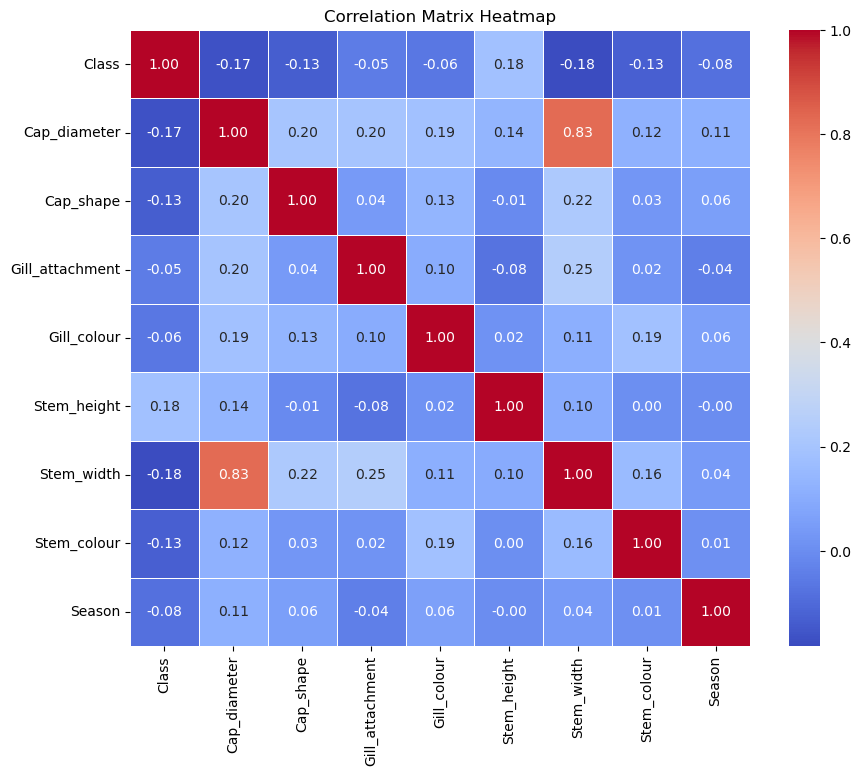

In [27]:
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
# Select only numerical columns


# Compute the correlation matrix for numerical columns
correlation_matrix = df.corr()



plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

there are columns with high correlation that is 
cap diameter and stem_width with 0.83 So we can remove any one 
here i am planning on removing the cap_diameter



# List of Prepocessing task

1. one hot encoding need to be done for the categorical columns
2. Need to Standardize the data
3. Feature Selection 

In [29]:
#df = df.drop(columns = ['Cap_diameter'])

In [30]:
df.head()

,Class,Cap_diameter,Cap_shape,Gill_attachment,Gill_colour,Stem_height,Stem_width,Stem_colour,Season
0,1,1372,2,2,10,3.807467,1545,11,1.804273
1,1,1461,2,2,10,3.807467,1557,11,1.804273
2,1,1371,2,2,10,3.612496,1566,11,1.804273
3,1,1261,6,2,10,3.787572,1566,11,1.804273
4,1,1305,6,2,10,3.711971,1464,11,0.943195


Stratify

# Stratification

In [32]:
from sklearn.model_selection import train_test_split
train_set , test_set = train_test_split(df,test_size = 0.20 , stratify = df['Class'],random_state =42)
print(train_set['Class'].value_counts()/len(train_set))

print(test_set['Class'].value_counts()/len(test_set))


Class
1    0.549181
0    0.450819
Name: count, dtype: float64
Class
1    0.549181
0    0.450819
Name: count, dtype: float64


In [33]:
mush = train_set.drop("Class", axis=1)
mush_labels = train_set["Class"].copy()

In [34]:
mush_labels

18466    1
50500    1
46280    0
2614     0
45169    0
        ..
43750    0
27698    1
37769    1
5343     0
48999    0
Name: Class, Length: 43228, dtype: int64

In [35]:
#Experiment 1
import numpy as np
from sklearn.preprocessing import StandardScaler,OneHotEncoder, MinMaxScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
def log_transform(x):
    return np.log1p(x)
    
numerical_cols = ["Cap_diameter", "Stem_height", "Stem_width", "Season"]
categorical_cols = ["Cap_shape", "Gill_attachment", "Gill_colour", "Stem_colour"]


# Full Pipeline with Logistic Regression
preprocessor = ColumnTransformer(
    transformers=[
        ("log_scale", Pipeline(steps=[
            ("log", FunctionTransformer(log_transform)),
            ("scale", StandardScaler())
        ]), numerical_cols),
        ("onehot", OneHotEncoder(), categorical_cols)
    ],
    remainder="passthrough"
)


mush_pipeline1 = Pipeline(steps=[
    ("preprocessor", preprocessor)
])


transformed_data = mush_pipeline1.named_steps["preprocessor"].fit_transform(mush)


onehot_feature_names = mush_pipeline1.named_steps["preprocessor"].transformers_[1][1].get_feature_names_out(categorical_cols)


processed_numerical_cols = [f"log_scaled_{col}" for col in numerical_cols]
all_feature_names = processed_numerical_cols + list(onehot_feature_names)


if hasattr(transformed_data, 'toarray'):
    transformed_data = transformed_data.toarray()


transformed_df = pd.DataFrame(transformed_data, columns=all_feature_names)

display(transformed_df)

,log_scaled_Cap_diameter,log_scaled_Stem_height,log_scaled_Stem_width,log_scaled_Season,Cap_shape_0,Cap_shape_1,Cap_shape_2,Cap_shape_3,Cap_shape_4,Cap_shape_5,...,Stem_colour_3,Stem_colour_4,Stem_colour_5,Stem_colour_6,Stem_colour_7,Stem_colour_8,Stem_colour_9,Stem_colour_10,Stem_colour_11,Stem_colour_12
0,-0.654607,0.987026,-0.214316,0.049761,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.158186,1.801517,-4.815785,-0.122668,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.351316,1.529531,0.909468,-0.122668,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.319131,1.093680,0.727348,0.049761,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,-0.397111,0.008814,0.221501,0.049761,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43223,0.717939,-0.589789,0.509875,-0.122668,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
43224,0.448834,-1.332253,0.171947,0.049761,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
43225,0.347321,-0.704481,-0.086780,-0.122668,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
43226,0.390535,0.016026,0.057475,-0.122668,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [36]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline 

log_reg = make_pipeline(preprocessor,LogisticRegression())

log_reg.fit(mush,mush_labels)
mush_pred = log_reg.predict(mush)
mush_pred[:8]


array([1, 1, 0, 0, 0, 0, 0, 1])

In [37]:
mush_labels.iloc[:8].values

array([1, 1, 0, 0, 0, 0, 0, 1])

In [38]:
log_reg

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_scale',
                                                  Pipeline(steps=[('log',
                                                                   FunctionTransformer(func=<function log_transform at 0x154dca5c0>)),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  ['Cap_diameter',
                                                   'Stem_height', 'Stem_width',
                                                   'Season']),
                                                 ('onehot', OneHotEncoder(),
                                                  ['Cap_shape',
                                                   'Gill_attachment',
                                                   'Gill_colour',
                                                   'Stem_colour'])])),
                ('logisticregression', LogisticRegression())])

In [39]:
log_reg.get_params()

{'memory': None,
 'steps': [('columntransformer',
   ColumnTransformer(remainder='passthrough',
                     transformers=[('log_scale',
                                    Pipeline(steps=[('log',
                                                     FunctionTransformer(func=<function log_transform at 0x154dca5c0>)),
                                                    ('scale', StandardScaler())]),
                                    ['Cap_diameter', 'Stem_height', 'Stem_width',
                                     'Season']),
                                   ('onehot', OneHotEncoder(),
                                    ['Cap_shape', 'Gill_attachment', 'Gill_colour',
                                     'Stem_colour'])])),
  ('logisticregression', LogisticRegression())],
 'verbose': False,
 'columntransformer': ColumnTransformer(remainder='passthrough',
                   transformers=[('log_scale',
                                  Pipeline(steps=[('log',
                  

In [40]:
from sklearn.metrics import f1_score, accuracy_score

# Compute F1-score (assuming binary classification, adjust for multi-class if needed)
log_f1 = f1_score(mush_labels, mush_pred)
print("F1-score:", log_f1)

# Alternatively, compute accuracy
log_accuracy = accuracy_score(mush_labels, mush_pred)
print("Accuracy:", log_accuracy)


F1-score: 0.7455923722807997
Accuracy: 0.7259415193855834


In [41]:
pip install dagshub mlflow

Note: you may need to restart the kernel to use updated packages.


In [42]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(mush_labels, mush_pred)
print("Confusion Matrix:\n", cm)

Confusion Matrix:
 [[14021  5467]
 [ 6380 17360]]


In [44]:
import os

MLFLOW_TRACKING_URI="https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME']='NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD']='51d8e707c1e34078ee484d724ede905fa7d48826'


import mlflow
from mlflow.models import infer_signature

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Create a new MLflow Experiment
mlflow.set_experiment("fall24_mushroom_Classification")

score = log_f1
params = {"test": 1}
with mlflow.start_run():
      # Log the hyperparameters
      mlflow.log_params(params)

      # Log metrics
      mlflow.log_metric("F1-score", score)
      # Infer the model signature
      signature = infer_signature(mush, log_reg.predict(mush))

      # Log the model
      model_info = mlflow.sklearn.log_model(
          sk_model=log_reg,
          artifact_path="mush_model",
          signature=signature,
          input_example=mush,
          registered_model_name="LogisticRegression",
      )

/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'LogisticRegression' already exists. Creating a new version of this model...
2024/12/19 23:30:34 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Logis

🏃 View run stately-mare-346 at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/85d7c82c6b0b43618fc034360ed14365
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


# Experiment #1: 

Creating a pipeline for preprocessing (StandardScaler, MinMaxScaler, LogTransformation, OneHotEncoding) and Logistic Regression. Log F1-score/(TP,TN,FN,FP)  in MLFlow on DagsHub. – Cross validation 3/10 folds. Results—mean/std of CV results and results on the whole training data – add in parameter hyper tuning

In [46]:
import os
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
import mlflow
from mlflow.models import infer_signature

# Set MLflow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '51d8e707c1e34078ee484d724ede905fa7d48826'

mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("fall24_mushroom_Classification")

# Define pipeline and hyperparameter grid
log_reg = make_pipeline(preprocessor, LogisticRegression())
param_grid = {
    'logisticregression__C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'logisticregression__solver': ['liblinear', 'lbfgs']  # Solvers
}
grid_search = GridSearchCV(log_reg, param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# Perform cross-validation
cv_3_fold = cross_val_score(grid_search, mush, mush_labels, cv=3, scoring='accuracy')
cv_10_fold = cross_val_score(grid_search, mush, mush_labels, cv=10, scoring='accuracy')

# Fit the GridSearchCV
grid_search.fit(mush, mush_labels)

# Predict and calculate the confusion matrix
mush_pred = grid_search.predict(mush)
cm = confusion_matrix(mush_labels, mush_pred)

# Extract TP, TN, FP, FN
if cm.shape == (2, 2):  # Ensure it's a binary classification problem
    tn, fp, fn, tp = cm.ravel()
else:
    raise ValueError("Confusion matrix is not 2x2; TP, TN, FP, FN are only applicable to binary classification.")

# Calculate F1 score
f1 = f1_score(mush_labels, mush_pred)

# Log to MLflow
with mlflow.start_run(run_name="LogisticRegression"):  # Set run_name as LogisticRegression
    # Log hyperparameters
    mlflow.log_params(grid_search.best_params_)

    # Log metrics
    mlflow.log_metrics({
        "cv_3_fold_mean": np.mean(cv_3_fold),
        "cv_3_fold_std": np.std(cv_3_fold),
        "cv_10_fold_mean": np.mean(cv_10_fold),
        "cv_10_fold_std": np.std(cv_10_fold),
        "best_cv_score": grid_search.best_score_,
        "train_accuracy": grid_search.score(mush, mush_labels),
        "true_positive": tp,
        "true_negative": tn,
        "false_positive": fp,
        "false_negative": fn,
        "f1_score": f1  # Log F1 score
    })

    # Infer the model signature
    signature = infer_signature(mush, mush_pred)

    # Log the model
    mlflow.sklearn.log_model(
        sk_model=grid_search.best_estimator_,
        artifact_path="mush_model",
        signature=signature,
        input_example=mush,
        registered_model_name="LogisticRegression",
    )

# Print Results
print("Confusion Matrix:\n", cm)
print(f"True Positive (TP): {tp}")
print(f"True Negative (TN): {tn}")
print(f"False Positive (FP): {fp}")
print(f"False Negative (FN): {fn}")
print(f"F1 Score: {f1:.4f}")
print(f"3-Fold Cross Validation Accuracy (Mean/Std): Mean = {np.mean(cv_3_fold):.4f}, Std = {np.std(cv_3_fold):.4f}")
print(f"10-Fold Cross Validation Accuracy (Mean/Std): Mean = {np.mean(cv_10_fold):.4f}, Std = {np.std(cv_10_fold):.4f}")
print(f"Best Hyperparameters: {grid_search.best_params_}")
print(f"Best Cross-validation Score: {grid_search.best_score_:.4f}")
print(f"Accuracy on the Whole Training Data: {grid_search.score(mush, mush_labels):.4f}")



/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'LogisticRegression' already exists. Creating a new version of this model...
2024/12/19 23:31:06 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Logis

🏃 View run LogisticRegression at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/aa56512208e240ba83898c2673cd51e6
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1
Confusion Matrix:
 [[14021  5467]
 [ 6380 17360]]
True Positive (TP): 17360
True Negative (TN): 14021
False Positive (FP): 5467
False Negative (FN): 6380
F1 Score: 0.7456
3-Fold Cross Validation Accuracy (Mean/Std): Mean = 0.7255, Std = 0.0057
10-Fold Cross Validation Accuracy (Mean/Std): Mean = 0.7254, Std = 0.0082
Best Hyperparameters: {'logisticregression__C': 1, 'logisticregression__solver': 'lbfgs'}
Best Cross-validation Score: 0.7259
Accuracy on the Whole Training Data: 0.7259


In [47]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.


# Experiment #2: 

Create a pipeline for preprocessing and use LogisticRegression, RidgeClassifier, RandomForestClassifier, and XGBClassifier. Log results in MLFlow on DagsHub.

In [48]:
import os
import numpy as np
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
import mlflow

# Set MLflow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '51d8e707c1e34078ee484d724ede905fa7d48826'

mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("fall24_mushroom_Classification")

# Define the log-transform function
def log_transform(x):
    return np.log1p(x)

# Models to train
models = {
    "LogisticRegression": LogisticRegression(),
    "RidgeClassifier": RidgeClassifier(),
    "RandomForestClassifier": RandomForestClassifier(),
    "XGBClassifier": XGBClassifier(),
}

# Loop over models and log results
for model_name, model in models.items():
    # Create pipeline
    pipeline = make_pipeline(preprocessor, model)

    # Cross-validation
    cv_scores = cross_val_score(pipeline, mush, mush_labels, cv=5, scoring="accuracy")
    mean_cv_score = np.mean(cv_scores)
    std_cv_score = np.std(cv_scores)

    # Create a custom run name
    run_name = f"{model_name}"  # You can add more details like timestamp, etc.

    # Log results in MLflow with custom run name
    with mlflow.start_run(run_name=run_name):  # Use the dynamic run_name
        # Log metrics
        mlflow.log_metrics({
            "cv_mean_accuracy": mean_cv_score,
            "cv_std_accuracy": std_cv_score,
        })

        # Log the model with its respective name
        mlflow.sklearn.log_model(
            sk_model=pipeline,
            artifact_path="model_artifacts",
            registered_model_name=model_name,  # Use model_name directly
        )

        print(f"Model {model_name} logged successfully with run name: {run_name}.")


2024/12/19 23:31:10 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'LogisticRegression' already exists. Creating a new version of this model...
2024/12/19 23:31:14 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LogisticRegression, version 10
Created version '10' of model 'LogisticRegression'.


Model LogisticRegression logged successfully with run name: LogisticRegression.
🏃 View run LogisticRegression at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/6ad0a0c9451d4d5fb700bd98ec977355
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


2024/12/19 23:31:19 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'RidgeClassifier' already exists. Creating a new version of this model...
2024/12/19 23:31:28 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RidgeClassifier, version 4
Created version '4' of model 'RidgeClassifier'.


Model RidgeClassifier logged successfully with run name: RidgeClassifier.
🏃 View run RidgeClassifier at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/2b737fc65a42401a9ef9d9964d2adf65
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


2024/12/19 23:31:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'RandomForestClassifier' already exists. Creating a new version of this model...
2024/12/19 23:31:53 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RandomForestClassifier, version 4
Created version '4' of model 'RandomForestClassifier'.


Model RandomForestClassifier logged successfully with run name: RandomForestClassifier.
🏃 View run RandomForestClassifier at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/038473ff4d594ccd9e7d52218d72de57
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


2024/12/19 23:31:56 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'XGBClassifier' already exists. Creating a new version of this model...
2024/12/19 23:32:04 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: XGBClassifier, version 4
Created version '4' of model 'XGBClassifier'.


Model XGBClassifier logged successfully with run name: XGBClassifier.
🏃 View run XGBClassifier at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/9ebbe81e7a494f6fbf32f49788b84770
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


# Experiment #3: 

Perform feature engineering and attribute combination. Log results in MLFlow.

In [49]:
import os
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
import mlflow

# Set MLflow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '51d8e707c1e34078ee484d724ede905fa7d48826'

mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("fall24_mushroom_Classification")

# Define the log-transform function
def log_transform(x):
    return np.log1p(x)

# Example of feature engineering and attribute combination
# Create new features by combining numerical columns (interaction features)
def feature_engineering(df):
    # Add 'Stem_size' as a new feature by multiplying 'Stem_height' and 'Stem_width'
    df['Stem_size'] = df['Stem_height'] * df['Stem_width']
    
    return df


# Feature engineering before applying transformations
mush = feature_engineering(mush)  # Assuming mush is your feature DataFrame

preprocessor = ColumnTransformer(
    transformers=[
        (
            "log_scale",
            Pipeline(steps=[
                ("log", FunctionTransformer(log_transform)),
                ("scale", StandardScaler())
            ]),
            numerical_cols
        ),
        ("onehot", OneHotEncoder(handle_unknown="ignore"), categorical_cols)
    ],
    remainder="passthrough"
)

# Models to train
models = {
    "LogisticRegression": LogisticRegression(),
}

# Loop over models and log results
for model_name, model in models.items():
    # Create pipeline
    pipeline = make_pipeline(preprocessor, model)

    # Cross-validation
    cv_scores = cross_val_score(pipeline, mush, mush_labels, cv=5, scoring="accuracy")
    mean_cv_score = np.mean(cv_scores)
    std_cv_score = np.std(cv_scores)

    run_name = f"FE_{model_name}"  # Example: You can customize the run name further if needed

    # Log results in MLflow under 'feature_engineering' model name
    with mlflow.start_run(run_name=run_name):  # Set the custom run name here
        # Log metrics
        mlflow.log_metrics({
            "cv_mean_accuracy": mean_cv_score,
            "cv_std_accuracy": std_cv_score,
        })

        # Log the model with the name 'feature_engineering'
        mlflow.sklearn.log_model(
            sk_model=pipeline,
            artifact_path="model_artifacts",
            registered_model_name="feature_engineering",  # Log under this name
        )

        print(f"Model {model_name} logged under 'feature_engineering' with run name '{run_name}' successfully.")


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

Model LogisticRegression logged under 'feature_engineering' with run name 'FE_LogisticRegression' successfully.
🏃 View run FE_LogisticRegression at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/190b108fc2f448c9b0203aaffd5ac70a
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


# Experiment #4: 

Perform feature selection using Correlation Threshold, Feature Importance, and Variance Threshold. Log results in MLFlow.



In [50]:
import os
import numpy as np
import mlflow
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_val_score

# Set MLflow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '51d8e707c1e34078ee484d724ede905fa7d48826'

mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("fall24_mushroom_Classification")

# Preprocessing pipeline (you can modify this as per your existing preprocessing)
def log_transform(x):
    return np.log1p(x)

# Feature selection methods
def correlation_threshold(X, threshold=0.9):
    # Compute the correlation matrix and drop features with correlation higher than the threshold
    corr_matrix = X.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    return X.drop(columns=to_drop), to_drop

def feature_importance(X, y, model=None, threshold=0.01):
    if model is None:
        model = RandomForestClassifier(n_estimators=100)
    model.fit(X, y)
    importances = model.feature_importances_
    important_features = X.columns[importances >= threshold]
    return X[important_features], list(set(X.columns) - set(important_features))

def variance_threshold(X, threshold=0.01):
    selector = VarianceThreshold(threshold=threshold)
    X_new = selector.fit_transform(X)
    selected_columns = X.columns[selector.get_support()]
    return X[selected_columns], list(set(X.columns) - set(selected_columns))

# Split data
train_set, test_set = train_test_split(df, test_size=0.2, stratify=df['Class'], random_state=42)
mush = train_set.drop("Class", axis=1)
mush_labels = train_set["Class"].copy()

# Log feature selection methods
with mlflow.start_run(run_name="FeatureSelection"):
    
    # 1. Correlation Threshold
    X_corr, dropped_corr = correlation_threshold(mush, threshold=0.75)
    mlflow.log_params({"correlation_threshold": 0.75, "dropped_features_corr": dropped_corr})
    
    # 2. Feature Importance
    X_important, dropped_imp = feature_importance(mush, mush_labels, model=RandomForestClassifier(), threshold=0.05)
    mlflow.log_params({"threshold_feature_importance": 0.05, "dropped_features_imp": dropped_imp})
    
    # 3. Variance Threshold
    X_variance, dropped_var = variance_threshold(mush, threshold=0.06)
    mlflow.log_params({"variance_threshold": 0.06, "dropped_features_var": dropped_var})
    
    # Cross-validation and accuracy for final selected features (after feature selection)
    def cross_val_accuracy(X, y):
        model = RandomForestClassifier(n_estimators=100)
        return np.mean(cross_val_score(model, X, y, cv=5, scoring='accuracy'))
    
    # Log metrics for all feature selection methods
    mlflow.log_metrics({
        "cv_accuracy_corr": cross_val_accuracy(X_corr, mush_labels),
        "cv_accuracy_imp": cross_val_accuracy(X_important, mush_labels),
        "cv_accuracy_var": cross_val_accuracy(X_variance, mush_labels),
    })
    
    print(f"Logged feature selection and accuracy metrics in MLFlow.")

# Display results
print(f"Dropped Features due to Correlation: {dropped_corr}")
print(f"Dropped Features due to Feature Importance: {dropped_imp}")
print(f"Dropped Features due to Variance Threshold: {dropped_var}")


Logged feature selection and accuracy metrics in MLFlow.
🏃 View run FeatureSelection at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/e5d80f27406b457690aa4e6b23699484
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1
Dropped Features due to Correlation: ['Stem_width']
Dropped Features due to Feature Importance: ['Season']
Dropped Features due to Variance Threshold: []


# Experiment #5: 

Use PCA for dimensionality reduction on all the features. Create a scree plot to show which components will be selected for classification. Log results in MLFlow.


Logged PCA results with 7 components selected for classification.
🏃 View run PCA_Dimensionality_Reduction at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/d7a0af86ef4346bc86a7763f2a8e5cc9
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1
Explained Variance Ratio: [0.26650247 0.14329874 0.13310412 0.12367945 0.11338653 0.10175368
 0.08588429 0.03239073]
Number of Components Selected for Classification (>= 90% variance): 7


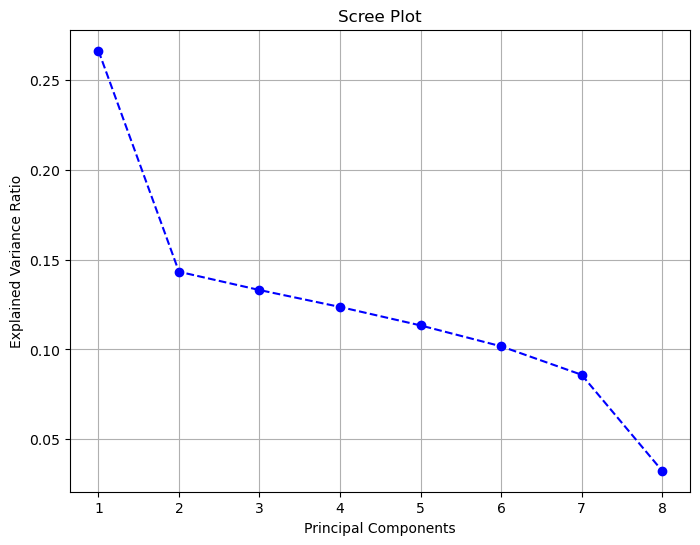

In [51]:
import os
import numpy as np
import matplotlib.pyplot as plt
import mlflow
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline

# Set MLflow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '51d8e707c1e34078ee484d724ede905fa7d48826'

mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("fall24_mushroom_Classification")

# Define the preprocessing pipeline (you can modify this as per your existing preprocessing)
def log_transform(x):
    return np.log1p(x)

# Split data
train_set, test_set = train_test_split(df, test_size=0.2, stratify=df['Class'], random_state=42)
mush = train_set.drop("Class", axis=1)
mush_labels = train_set["Class"].copy()

# Define pipeline with preprocessing and PCA
preprocessor = ColumnTransformer(
    transformers=[
        ("log_scale", Pipeline(steps=[("log", FunctionTransformer(log_transform)), ("scale", StandardScaler())]), mush.columns),
    ]
)

# Start MLflow run for PCA
with mlflow.start_run(run_name="PCA_Dimensionality_Reduction"):
    
    # Preprocess data (standard scaling)
    pipeline = make_pipeline(preprocessor)
    mush_processed = pipeline.fit_transform(mush)
    
    # Apply PCA
    pca = PCA()
    mush_pca = pca.fit_transform(mush_processed)
    
    # Explained variance ratio (scree plot)
    explained_variance = pca.explained_variance_ratio_
    
    # Log the explained variance for each component
    mlflow.log_params({"explained_variance_ratio": explained_variance.tolist()})
    
    # Plot the scree plot
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--', color='b')
    plt.title('Scree Plot')
    plt.xlabel('Principal Components')
    plt.ylabel('Explained Variance Ratio')
    plt.grid(True)
    
    # Save the scree plot as an artifact in MLFlow
    scree_plot_path = "scree_plot.png"
    plt.savefig(scree_plot_path)
    mlflow.log_artifact(scree_plot_path)
    
    # Log the number of components selected for classification (based on cumulative explained variance threshold, e.g., 90%)
    cumulative_explained_variance = np.cumsum(explained_variance)
    n_components_selected = np.argmax(cumulative_explained_variance >= 0.90) + 1  # Select components that explain at least 90% variance
    mlflow.log_params({"n_components_selected": n_components_selected})
    
    print(f"Logged PCA results with {n_components_selected} components selected for classification.")

# Print Results
print(f"Explained Variance Ratio: {explained_variance}")
print(f"Number of Components Selected for Classification (>= 90% variance): {n_components_selected}")


# Experiment #6: 
Design and execute a custom experiment. Log results in MLFlow.


In [52]:
import os
import numpy as np
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, f1_score
import mlflow

# Set MLflow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '51d8e707c1e34078ee484d724ede905fa7d48826'

mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("fall24_mushroom_Classification")

# Define the log-transform function
def log_transform(x):
    return np.log1p(x)

# SVM Model to train
model_name = "SVM_RBF"
model = SVC(kernel='rbf')

# Create pipeline
pipeline = make_pipeline(preprocessor, model)

# Cross-validation for F1 score
cv_f1_scores = cross_val_score(pipeline, mush, mush_labels, cv=5, scoring=make_scorer(f1_score, average='weighted'))

mean_cv_f1 = np.mean(cv_f1_scores)
std_cv_f1 = np.std(cv_f1_scores)

# Create a custom run name
run_name = f"{model_name}"  # You can add more details like timestamp, etc.

# Log results in MLflow with custom run name
with mlflow.start_run(run_name=run_name):  # Use the dynamic run_name
    # Log metrics
    mlflow.log_metrics({
        "cv_mean_f1": mean_cv_f1,
        "cv_std_f1": std_cv_f1,
    })

    # Log the model with its respective name
    mlflow.sklearn.log_model(
        sk_model=pipeline,
        artifact_path="model_artifacts",
        registered_model_name=model_name,  # Use model_name directly
    )

    print(f"Model {model_name} logged successfully with run name: {run_name}.")


2024/12/19 23:33:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'SVM_RBF' already exists. Creating a new version of this model...
2024/12/19 23:34:00 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: SVM_RBF, version 2
Created version '2' of model 'SVM_RBF'.


Model SVM_RBF logged successfully with run name: SVM_RBF.
🏃 View run SVM_RBF at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/5e8dac62b26641a3b8d8e2e26d8c0783
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


# Experiment #7: 

Design and execute another custom experiment. Log results in MLFlow.


In [53]:
import os
import numpy as np
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.cluster import KMeans
import mlflow

# Set MLflow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'NithisshKrishna'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '51d8e707c1e34078ee484d724ede905fa7d48826'

mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("fall24_mushroom_Classification")

# Define the log-transform function
def log_transform(x):
    return np.log1p(x)

# KMeans Clustering
kmeans_model_name = "KMeans_Clustering"
kmeans_pipeline = make_pipeline(preprocessor, KMeans(n_clusters=3, random_state=42))
kmeans_pipeline.fit(mush)

# Assign predicted labels
kmeans = kmeans_pipeline.named_steps['kmeans']
predicted_labels = kmeans.labels_

# Calculate F1 score
f1_scores = []
for cluster in np.unique(predicted_labels):
    # Map each cluster to the most common true label
    true_labels_in_cluster = mush_labels[predicted_labels == cluster]
    most_common_label = true_labels_in_cluster.mode()[0]
    binary_true_labels = (mush_labels == most_common_label).astype(int)
    binary_predicted_labels = (predicted_labels == cluster).astype(int)
    f1 = f1_score(binary_true_labels, binary_predicted_labels)
    f1_scores.append(f1)

f1_mean = np.mean(f1_scores)
f1_std = np.std(f1_scores)

# Log KMeans results in MLflow
with mlflow.start_run(run_name=kmeans_model_name):
    # Log metrics
    mlflow.log_metrics({
        "inertia": kmeans.inertia_,
        "f1_mean": f1_mean,
        "f1_std": f1_std
    })

    # Log the model
    mlflow.sklearn.log_model(
        sk_model=kmeans_pipeline,
        artifact_path="kmeans_model_artifacts",
        registered_model_name=kmeans_model_name,  # Use kmeans_model_name directly
    )

    print(f"Model {kmeans_model_name} logged successfully with run name: {kmeans_model_name}.")


2024/12/19 23:34:03 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'KMeans_Clustering' already exists. Creating a new version of this model...
2024/12/19 23:34:10 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: KMeans_Clustering, version 3
Created version '3' of model 'KMeans_Clustering'.


Model KMeans_Clustering logged successfully with run name: KMeans_Clustering.
🏃 View run KMeans_Clustering at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1/runs/f0a3f4167f6e4cfd8d11ad096e6b65fc
🧪 View experiment at: https://dagshub.com/NithisshKrishna/fall_2024_mushroom_Classification.mlflow/#/experiments/1


# Best Model 
Create meaningful F1-score plots to compare experiments and determine the best model.

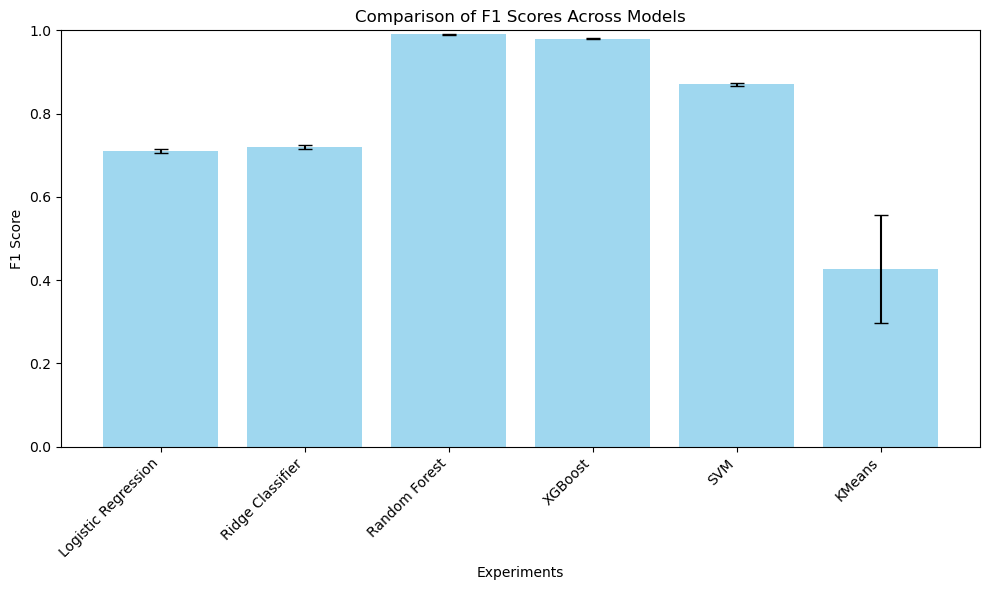

In [54]:
import matplotlib.pyplot as plt
import pandas as pd

# Example data: Replace this with actual values logged in MLFlow
experiment_results = { 
    "Experiment": ["Logistic Regression", "Ridge Classifier", "Random Forest", "XGBoost","SVM" , "KMeans"],
    "F1_Mean": [0.71, 0.72,0.99, 0.98, 0.87, 0.427],  # Use actual F1 mean values
    "F1_Std": [0.005, 0.005,0.001, 0.001, 0.004, 0.13],    # Use actual F1 std values
}

# Create a DataFrame
df_results = pd.DataFrame(experiment_results)

# Plot F1 scores with error bars
plt.figure(figsize=(10, 6))
plt.bar(df_results["Experiment"], df_results["F1_Mean"], yerr=df_results["F1_Std"], capsize=5, color='skyblue', alpha=0.8)
plt.xlabel("Experiments")
plt.ylabel("F1 Score")
plt.title("Comparison of F1 Scores Across Models")
plt.ylim(0, 1)  # F1 scores range from 0 to 1
plt.xticks(rotation=45, ha="right")
plt.tight_layout()

# Save the plot if needed
plt.savefig("f1_score_comparison.png")

# Show the plot
plt.show()


In [55]:
import joblib
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Assuming mush and mush_labels are your dataset and labels
X_train, X_test, y_train, y_test = train_test_split(mush, mush_labels, test_size=0.3, random_state=42)

# Initialize the Random Forest model
rf_model = RandomForestClassifier()

# Perform cross-validation
cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='accuracy')

# Calculate the mean and standard deviation of the cross-validation scores
mean_cv_score = np.mean(cv_scores)
std_cv_score = np.std(cv_scores)

# Print the results
print(f"Mean accuracy: {mean_cv_score:.4f}")
print(f"Standard deviation: {std_cv_score:.4f}")

# Train the model on the full training set
rf_model.fit(X_train, y_train)

# Save the trained Random Forest model using joblib
Final_model = "Final_model_rf.joblib"
joblib.dump(rf_model, Final_model)

print(f"Random Forest model saved as {Final_model}.")


Mean accuracy: 0.9881
Standard deviation: 0.0014
Random Forest model saved as Final_model_rf.joblib.


# Joblib

Saving th final model using Joblib

In [56]:
import joblib
import numpy as np

# Load the saved Random Forest model
loaded_rf_model = joblib.load("Final_model_rf.joblib")

# Assuming X_test is your test data (the features on which you want to predict)
# If you have new data (for example, new data to predict), use that instead of X_test
predictions = loaded_rf_model.predict(mush)

# Print the predictions
print("Predictions:", predictions)

Predictions: [1 1 0 ... 1 0 0]


In [73]:
mush

,Cap_diameter,Cap_shape,Gill_attachment,Gill_colour,Stem_height,Stem_width,Stem_colour,Season
18466,246,6,0,11,1.301555,490,12,0.943195
50500,377,3,0,10,2.013794,0,2,0.888450
46280,584,6,4,3,1.754308,2229,11,0.888450
2614,1340,6,2,10,1.384262,1744,11,0.943195
45169,307,6,4,11,0.664917,882,6,0.943195
...,...,...,...,...,...,...,...,...
43750,800,6,4,11,0.365641,1301,1,0.888450
27698,635,5,1,10,0.068069,825,1,0.943195
37769,582,2,0,11,0.314766,582,12,0.888450
5343,604,5,1,10,0.668896,707,11,0.888450


In [81]:
pip install requests

Note: you may need to restart the kernel to use updated packages.


In [79]:
a_row = mush.iloc[0]
a_row.to_dict()

{'Cap_diameter': 246.0,
 'Cap_shape': 6.0,
 'Gill_attachment': 0.0,
 'Gill_colour': 11.0,
 'Stem_height': 1.301555092594204,
 'Stem_width': 490.0,
 'Stem_colour': 12.0,
 'Season': 0.9431945538974952}

In [172]:
import json
data = json.dumps(a_row.to_dict(),indent=2)
data


'{\n  "Cap_diameter": 246.0,\n  "Cap_shape": 6.0,\n  "Gill_attachment": 0.0,\n  "Gill_colour": 11.0,\n  "Stem_height": 1.301555092594204,\n  "Stem_width": 490.0,\n  "Stem_colour": 12.0,\n  "Season": 0.9431945538974952\n}'

In [174]:
import requests

r = requests.post('http://127.0.0.1:8000/predict',data = data)


In [176]:
print(r.json())

{'prediction': 1}


In [166]:
import math
import pandas as pd
from collections import defaultdict
import json

# Load data
data = pd.read_csv('after_db.csv')

# Define fields
slider_fields = {
    "Cap_diameter",
    "Cap_shape",
    "Gill_attachment",
    "Season",
    "Stem_height",
    "Stem_width",
    "Stem_colour",
}

single_select_fields = ["Gill_colour"]

# Initialize defaultdict for nested dictionaries
streamlit_field_data = defaultdict(lambda: defaultdict(dict))

# Compute ranges for slider fields
streamlit_field_data["slider_fields"] = {}
for field in slider_fields:
    if field in data.columns:
        try:
            streamlit_field_data["slider_fields"][field] = [
                int(math.floor(data[field].min())),  # Convert to int
                int(math.ceil(data[field].max())),   # Convert to int
            ]
        except Exception as e:
            print(f"Error processing slider field {field}: {e}")

# Compute unique values for single select fields
streamlit_field_data["single_select_fields"] = {}
for field in single_select_fields:
    if field in data.columns:
        try:
            # Convert all unique values to Python native types
            streamlit_field_data["single_select_fields"][field] = [str(val) for val in sorted(data[field].unique())]
        except Exception as e:
            print(f"Error processing single select field {field}: {e}")

# Save as JSON
def convert_to_serializable(obj):
    """Recursively convert non-serializable objects to serializable types."""
    if isinstance(obj, (np.int64, np.int32)):
        return int(obj)
    if isinstance(obj, (np.float64, np.float32)):
        return float(obj)
    if isinstance(obj, dict):
        return {key: convert_to_serializable(value) for key, value in obj.items()}
    if isinstance(obj, list):
        return [convert_to_serializable(item) for item in obj]
    return obj

# Convert the data to serializable format and save to JSON
serializable_data = convert_to_serializable(streamlit_field_data)
with open("streamlit_options.json", "w") as f:
    json.dump(serializable_data, f, indent=2)

print("Data saved to streamlit_options.json")


Data saved to streamlit_options.json
